In [ ]:
# COMPARATIVE ANALYSIS OF TWO MS SPECTRA
#
# Identify unique features from each spectrum and create graphs to identify potentially interesting areas for deeper analysis
#
# 1. Load both datasets
# 2. Filter out common molecular expressions at relatively similar Retention Times
# 3. Plot M/Z vs RT to identify unique features
# 4. Select top 'k' RT (highest occurence of unique features)
# 5. Plot spectral graphs for top events


# import libraries

import pandas as pd
import numpy as np
from array import *
from sklearn.cluster import KMeans

import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.express as px
import plotly.figure_factory as ff

!pip install pyopenms

import pyopenms as ms

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [15, 5]

pyo.init_notebook_mode()
viridis = px.colors.sequential.Viridis

In [ ]:
# Load Data

newFile=pd.read_csv("~/Downloads/new.csv")
oldFile=pd.read_csv("~/Downloads/old.csv")
gabaFile=pd.read_csv("~/Downloads/gaba.csv")



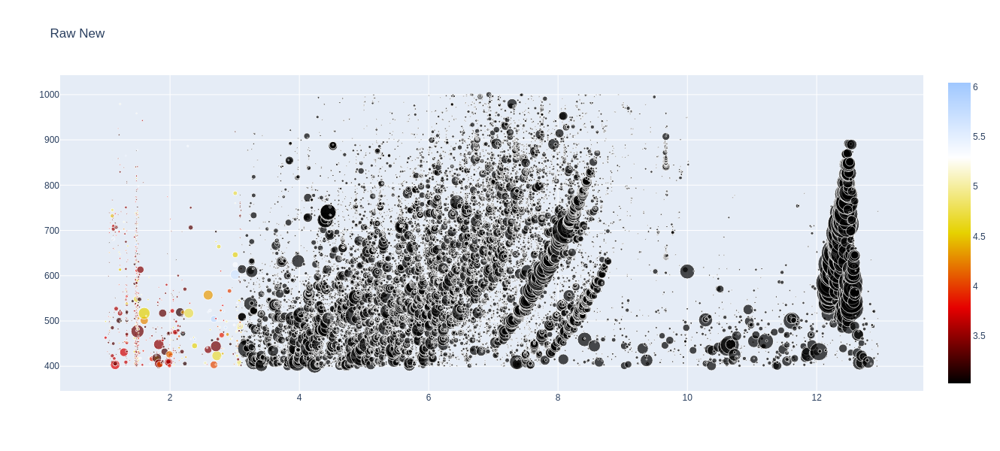

In [55]:
# Graph scatterplot for first dataset

trace = go.Scatter(
    x = newFile['RT'],
   y = newFile['m/z'],
    mode = 'markers',
    marker_size=newFile['Width']*40,
   marker=dict(
        color=filteredNew['Response'],
        colorscale='blackbody',
        showscale=True
    ))
data = [trace]

layout = go.Layout(
    title = 'Raw New',
    autosize=False,
    width=600,
    height=600
)

fig = go.Figure(data = data, layout = layout)

#pyo.iplot(data, filename = 'heatmap')

fig.show()

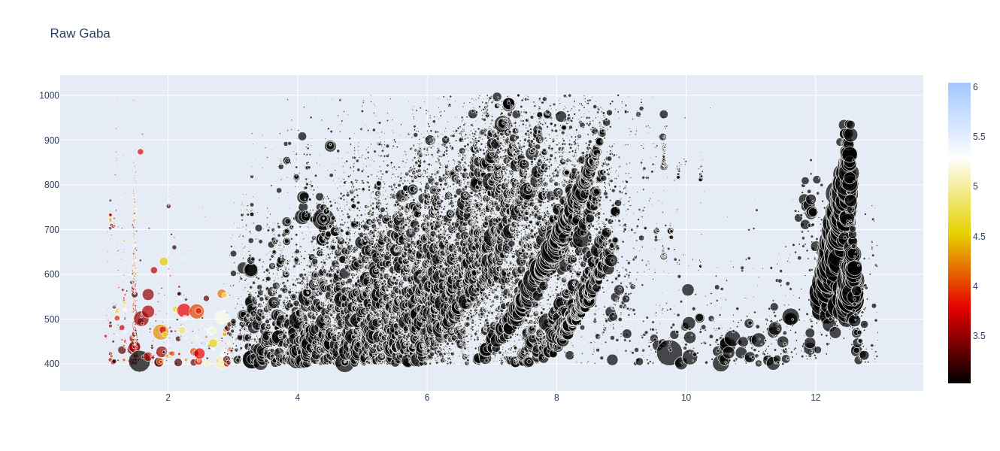

In [56]:
# Graph scatterplot for first dataset

trace = go.Scatter(
   x = gabaFile['RT'],
   y = gabaFile['m/z'],
    mode = 'markers',
    marker_size=gabaFile['Width']*40,
   marker=dict(
        color=filteredNew['Response'],
        colorscale='blackbody',
        showscale=True
    ))
data = [trace]

layout = go.Layout(
    title = 'Raw Gaba',
    autosize=False,
    width=600,
    height=600
)

fig = go.Figure(data = data, layout = layout)

#pyo.iplot(data, filename = 'heatmap')

fig.show()

In [83]:
# Resolution

MZTolerance = .11   # mass/charge resolution
respThreshold = 2000


In [84]:
# Construct pyopenms spectra

spectrumGaba = ms.MSSpectrum()
spectrumGaba.set_peaks([gabaFile['m/z'],gabaFile['Response']])
spectrumGaba.sortByPosition()

spectrumNew = ms.MSSpectrum()
spectrumNew.set_peaks([newFile['m/z'],newFile['Response']])
spectrumNew.sortByPosition()


In [85]:
# Align two spectra based on common m/z datapoints (relative RT)

alignment = []
spa = ms.SpectrumAlignment()
p = spa.getParameters()

p.setValue("tolerance", MZTolerance)
p.setValue("is_relative_tolerance", "false")
spa.setParameters(p)

# align both spectra
spa.getSpectrumAlignment(alignment, spectrumGaba, spectrumNew)

In [86]:
alnArray = np.array(alignment)

In [87]:
# Drop common datapoints from both spectra

filteredGaba = gabaFile.drop(gabaFile.index[alnArray[:,0]]).reset_index()
filteredNew = newFile.drop(newFile.index[alnArray[:,1]]).reset_index()

filteredGaba = filteredGaba[filteredGaba['Response']>respThreshold].reset_index()
filteredGaba = filteredNew[filteredNew['Response']>respThreshold].reset_index()


In [88]:
# Scale intensities

filteredGaba['Response'] = np.log10(filteredGaba['Response'])
filteredNew['Response'] = np.log10(filteredNew['Response'])

In [89]:
# Rebuild spectra based on new datasets 

spectrumGaba = ms.MSSpectrum()
spectrumGaba.set_peaks([filteredGaba['m/z'],filteredGaba['Response']])
spectrumGaba.sortByPosition()

spectrumNew = ms.MSSpectrum()
spectrumNew.set_peaks([filteredNew['m/z'],filteredNew['Response']])
spectrumNew.sortByPosition()

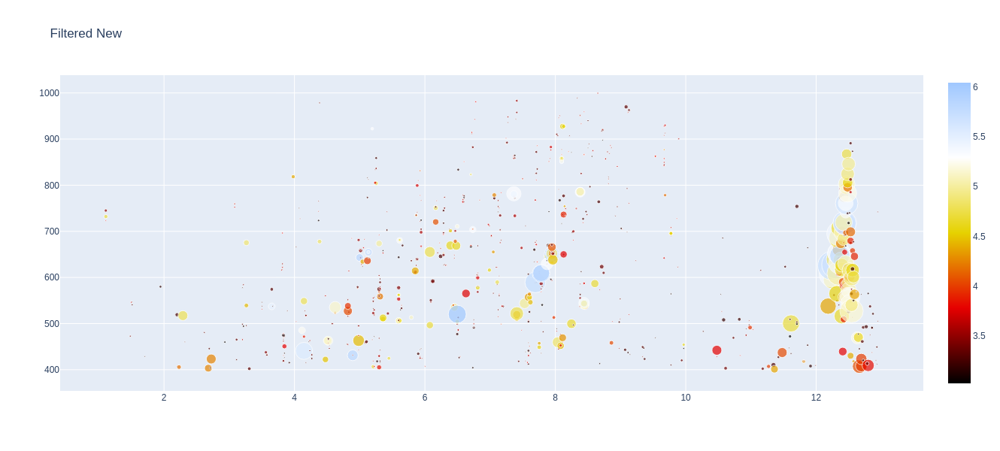

In [90]:
# Graph scatterplot for first dataset

trace = go.Scatter(
   x = filteredNew['RT'],
   y = filteredNew['m/z'],
    mode = 'markers',
    marker_size=filteredNew['Width']*40,
   marker=dict(
        color=filteredNew['Response'],
        colorscale='blackbody',
        showscale=True
    ))
data = [trace]

layout = go.Layout(
    title = 'Filtered New',
    autosize=False,
    width=600,
    height=600
)

fig = go.Figure(data = data, layout = layout)

#pyo.iplot(data, filename = 'heatmap')

fig.show()

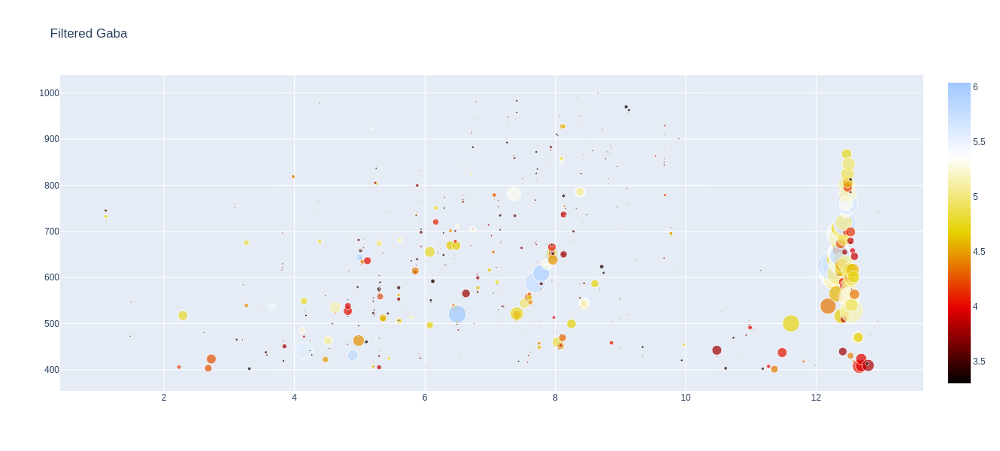

In [91]:
# Graph scatterplot for second dataset

trace = go.Scatter(
   x = filteredGaba['RT'],
   y = filteredGaba['m/z'],
    mode = 'markers',
    marker_size=filteredGaba['Width']*40,
   marker=dict(
        color=filteredGaba['Response'],
        colorscale='blackbody',
        showscale=True
    ))
data = [trace]

layout = go.Layout(
    title = 'Filtered Gaba',
    autosize=False,
    width=600,
    height=600
)

fig = go.Figure(data = data, layout = layout)

#pyo.iplot(data, filename = 'heatmap')

fig.show()

In [92]:
# Create datagroupings for combined scatterplot

filteredNew['group'] = 2
filteredGaba['group'] = 3

mergeCoord = pd.concat([filteredNew, filteredGaba], axis = 0)

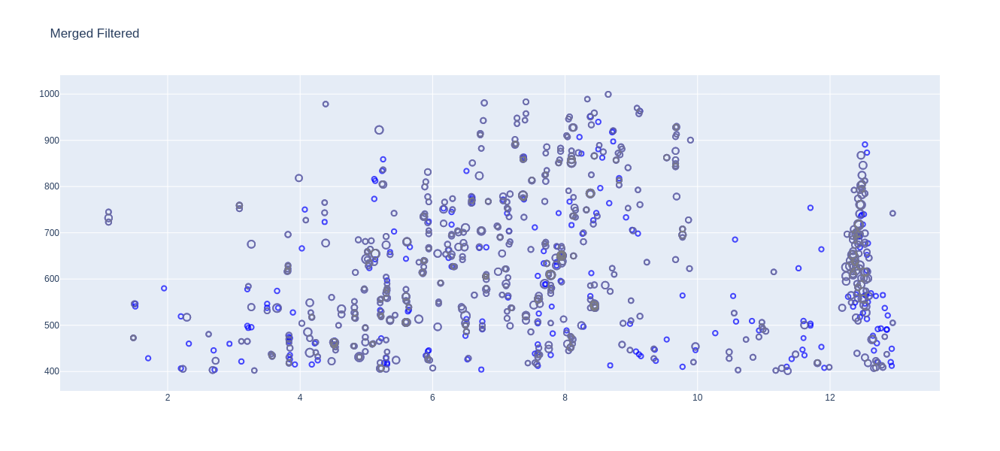

In [93]:
# Scatterplot both datasets, size based on intensity

colors = ['blue', 'grey']

trace = go.Scatter(
   x = mergeCoord['RT'],
   y = mergeCoord['m/z'],
   mode = 'markers',
    marker_size=mergeCoord['Response']*2,
   marker=dict(
       line=dict(width=2, color = mergeCoord['group'], colorscale = colors),
        color='rgba(255,0,255, 0.0)',
        showscale=False
    ))
data = [trace]

layout = go.Layout(
    title = 'Merged Filtered',
    autosize=False,
    width=600,
    height=600
)

fig = go.Figure(data = data, layout = layout)

#pyo.iplot(data, filename = 'heatmap')

fig.show()

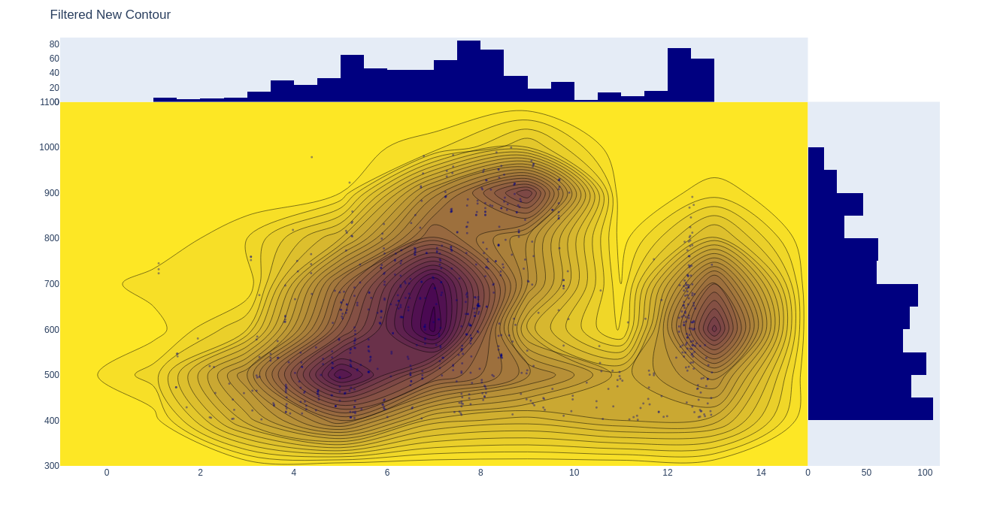

In [94]:
# Density plot for first dataset

fig = ff.create_2d_density(
    filteredNew['RT'], filteredNew['m/z'], colorscale = 'Viridis', ncontours=50,
    point_size=3
)
layout = go.Layout(
    title = 'Filtered New Contour',
    autosize=False,
    width=700,
    height=700

)

fig.update_layout(layout)
fig.show()

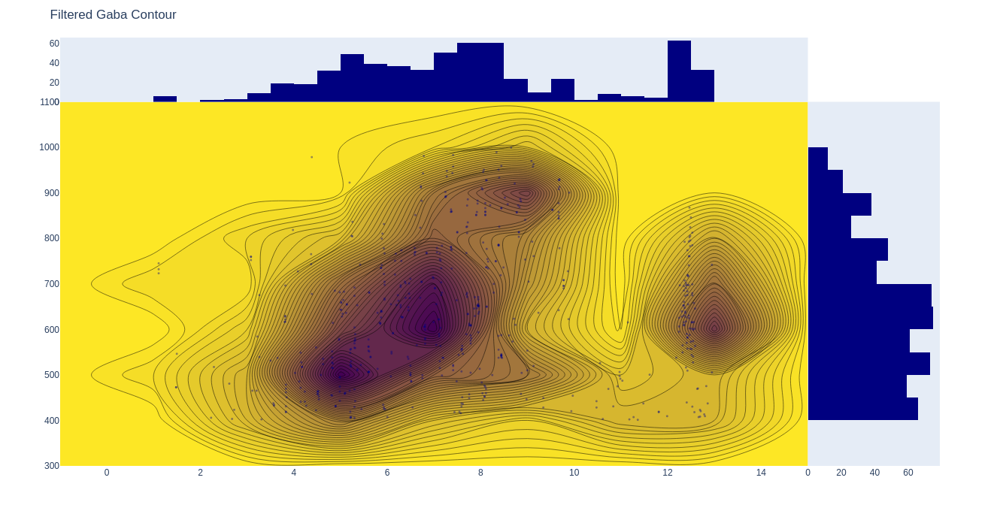

In [95]:
# Density plot for second dataset

fig = ff.create_2d_density(
    filteredGaba['RT'], filteredGaba['m/z'], colorscale = 'Viridis', ncontours = 50,
    point_size=3
)
layout = go.Layout(
    title = 'Filtered Gaba Contour',
    autosize=False,
    width=700,
    height=700
)

fig.update_layout(layout)
fig.show()

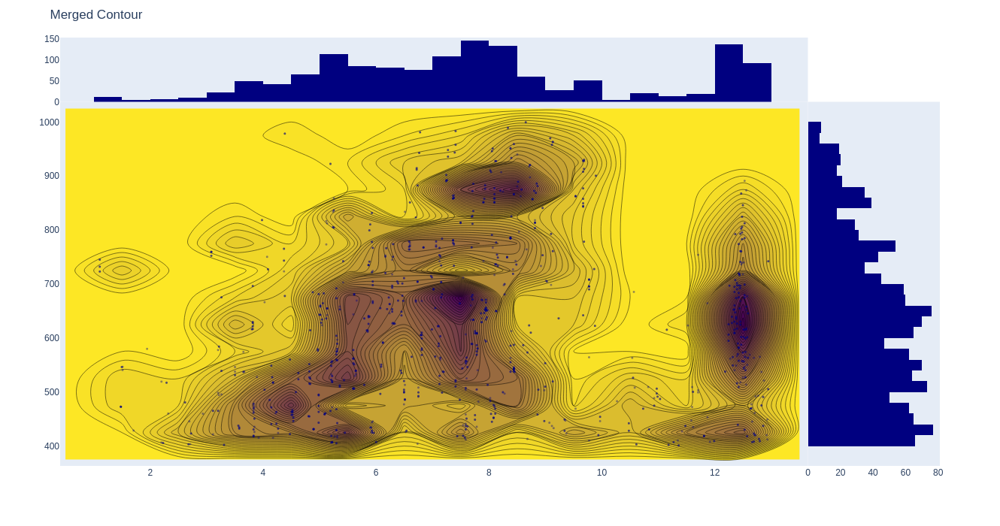

In [96]:
# Density plot for combined dataset

fig = ff.create_2d_density(
    mergeCoord['RT'], mergeCoord['m/z'], colorscale = 'Viridis', ncontours = 50,
    point_size=3
)
layout = go.Layout(
    title = 'Merged Contour',
    autosize=False,
    width=700,
    height=700
)

fig.update_layout(layout)
fig.show()

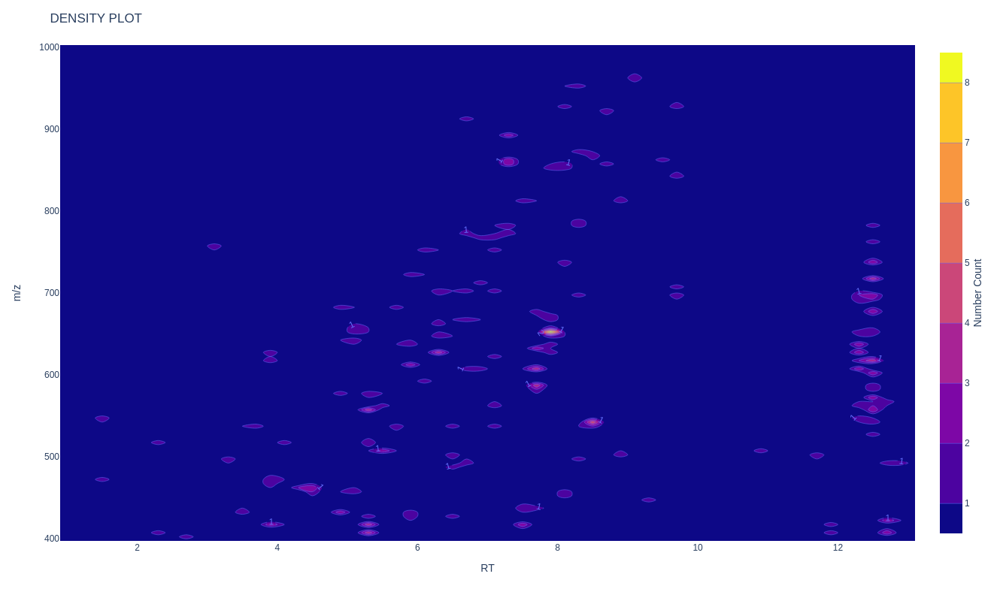

In [97]:
# Alternate density plot for first dataset 

fig = px.density_contour(filteredNew, x="RT", y="m/z", nbinsx = 100, nbinsy = 200, histfunc = 'max', 
                         histnorm = 'density')
fig.update_traces(
 contours_showlabels = True,
 contours_coloring="fill",
 colorbar=dict(
    title='Number Count', 
    titleside='right',
    titlefont=dict(
    size=14,
    family='Arial, sans-serif'))
)

#fig.update_xaxes(title_text='RT')
#fig.update_yaxes(title_text='M/Z')
fig.update_layout(
    height = 800,
    width =800,
    bargap = 0,
    #hovermode = 'closest',
    title_text='DENSITY PLOT',
    showlegend = True
    )
fig.show()


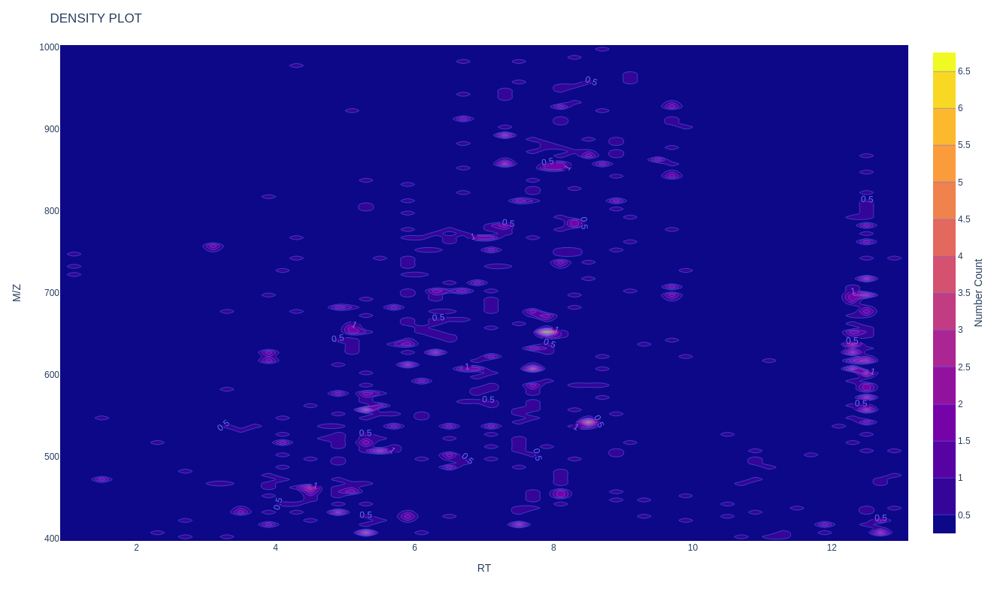

In [98]:
# Alternate density plot for second dataset

fig = px.density_contour(filteredGaba, x="RT", y="m/z", nbinsx = 100, nbinsy = 200, histfunc = 'max', histnorm = 'density')
fig.update_traces(
contours_showlabels = True,
contours_coloring="fill",
colorbar=dict(
    title='Number Count', 
    titleside='right',
    titlefont=dict(
    size=14,
    family='Arial, sans-serif')))
fig.update_xaxes(title_text='RT')
fig.update_yaxes(title_text='M/Z')
fig.update_layout(
    height = 800,
    width =800,
    bargap = 0,
    #hovermode = 'closest',
    title_text='DENSITY PLOT',
    showlegend = True
    )
fig.show()


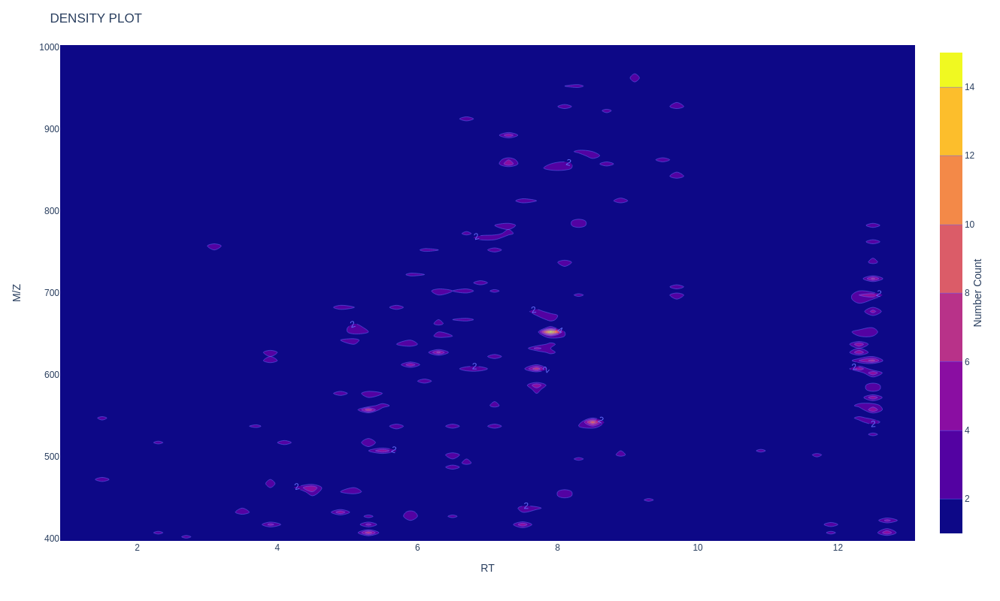

In [99]:
# Combined density plot

fig = px.density_contour(mergeCoord, x="RT", y="m/z", nbinsx = 100, nbinsy = 200, histfunc = 'max', histnorm = 'density')
fig.update_traces(
contours_showlabels = True,
contours_coloring="fill",
colorbar=dict(
    title='Number Count', 
    titleside='right',
    titlefont=dict(
    size=14,
    family='Arial, sans-serif')))
fig.update_xaxes(title_text='RT')
fig.update_yaxes(title_text='M/Z')
fig.update_layout(
    height = 800,
    width =800,
    bargap = 0,
    #hovermode = 'closest',
    title_text='DENSITY PLOT',
    showlegend = True
    )
fig.show()


In [100]:
RTFilter = mergeCoord.copy()
RTFilter['RT'] = RTFilter['RT'].round(1)
RTSum = RTFilter.groupby(by=['RT','Response']).count().groupby(by='RT').sum()

In [101]:
RTSort = RTSum.sort_values(by='m/z',ascending=False).head(5).reset_index()

In [102]:
RTSort

,RT,index,#,m/z,Width,RT Group,Ln response,ln width,group,level_0
0,12.5,78,78,78,78,78,78,78,78,33
1,12.4,57,57,57,57,57,57,57,57,27
2,8.1,50,50,50,50,50,50,50,50,24
3,5.9,48,48,48,48,48,48,48,48,22
4,8.4,48,48,48,48,48,48,48,48,22


In [103]:
# Spectrum plot function

def plot_spectrum(spectrum, threshold):
     # plot every peak in spectrum and annotate with it's m/z
     for mz, i in zip(*spectrum.get_peaks()):
        if (i > threshold):
          plt.plot([mz, mz], [0, i], color = 'black')
          plt.text(mz, i, str(mz))

     # for the title add RT and Precursor m/z if available
     title = ''
     if spectrum.getRT() >= 0:
         title += 'RT: ' + str(spectrum.getRT())
     if len(spectrum.getPrecursors()) >= 1:
         title += '   Precursor m/z: ' + str(spectrum.getPrecursors()[0].getMZ())

     plt.title(title)
     plt.ylabel('intensity')
     plt.xlabel('m/z')
     plt.ylim(bottom=0)

     plt.show()

In [104]:
# Function to plot spectrum comparison

def comp_plot(obs_mz, obs_int, theo_mz, theo_int, title):
    plt.figure(figsize=(16,8))
    plt.bar(obs_mz, obs_int, width = 1.0)
    plt.bar(theo_mz, theo_int, width = 1.0)
    plt.title(title)
    plt.ylabel('intensity')
    plt.xlabel('m/z')

In [105]:
# Build spectra

spectrumOld = ms.MSSpectrum()
spectrumOld.set_peaks([gabaFile['m/z'],gabaFile['Response']])
spectrumOld.sortByPosition()

spectrumNew = ms.MSSpectrum()
spectrumNew.set_peaks([newFile['m/z'],newFile['Response']])
spectrumNew.sortByPosition()


1st Spectrum RT =  5.9


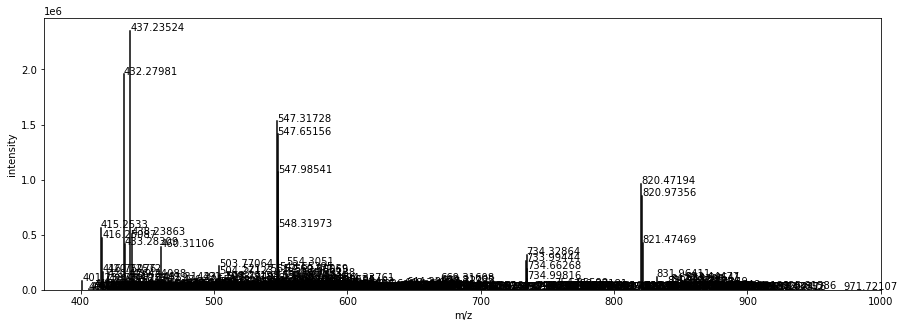

2nd Spectrum RT =  5.9


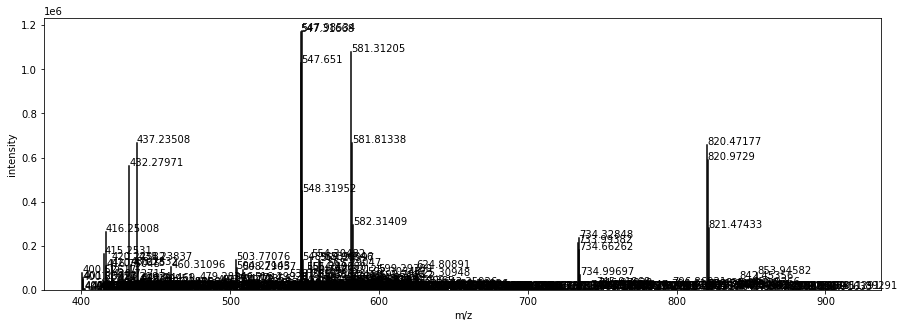

Comparative RT =  5.9


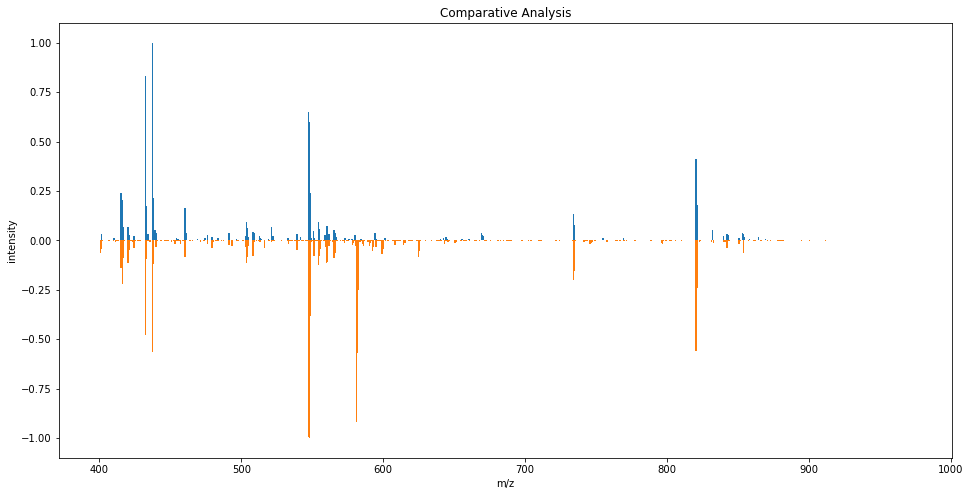

1st Spectrum RT =  8.1


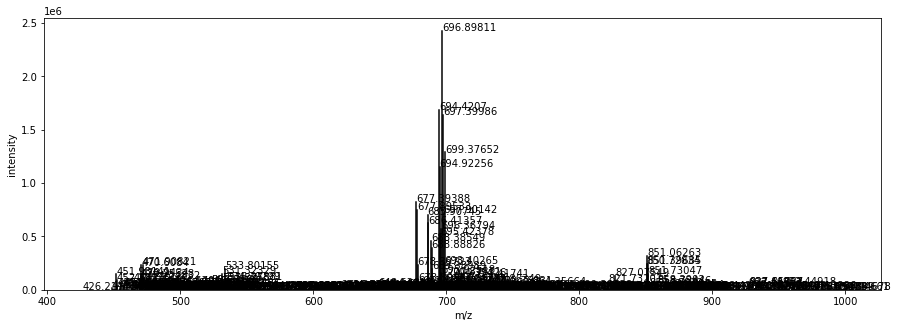

2nd Spectrum RT =  8.1


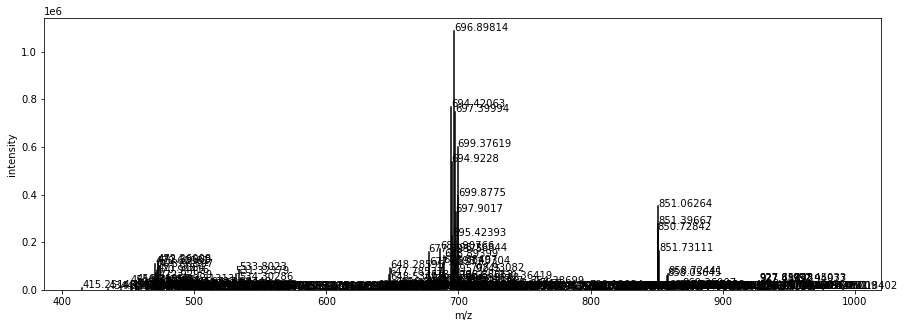

Comparative RT =  8.1


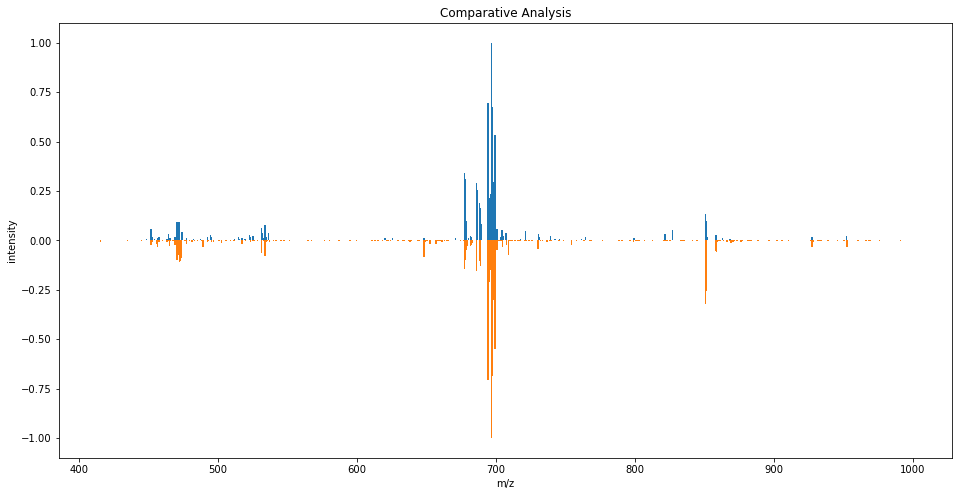

1st Spectrum RT =  8.4


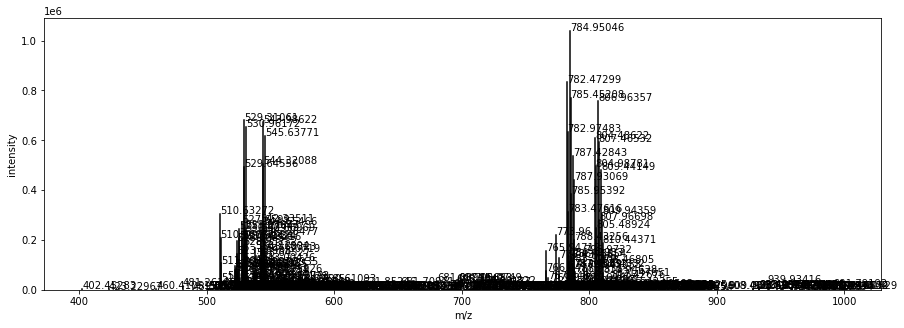

2nd Spectrum RT =  8.4


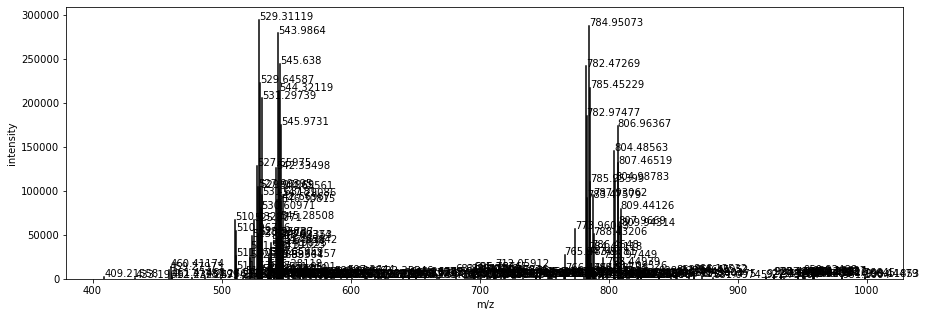

Comparative RT =  8.4


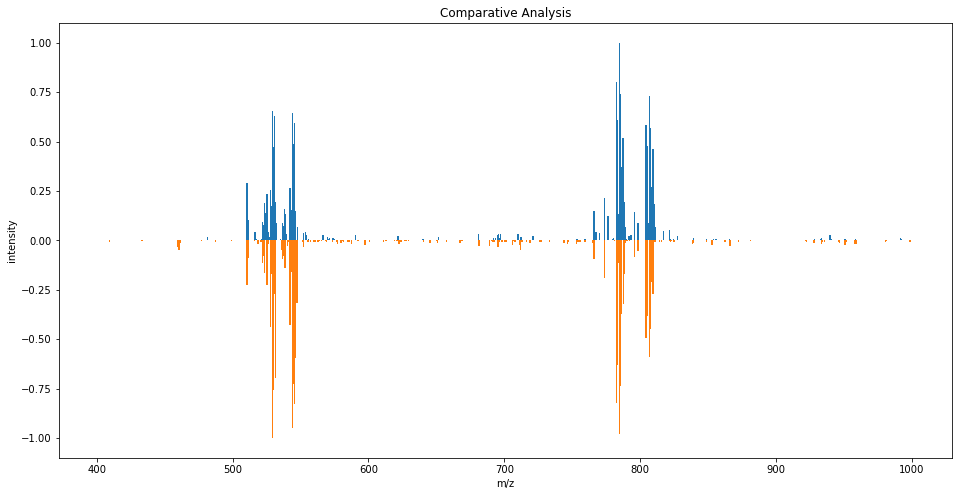

1st Spectrum RT =  12.4


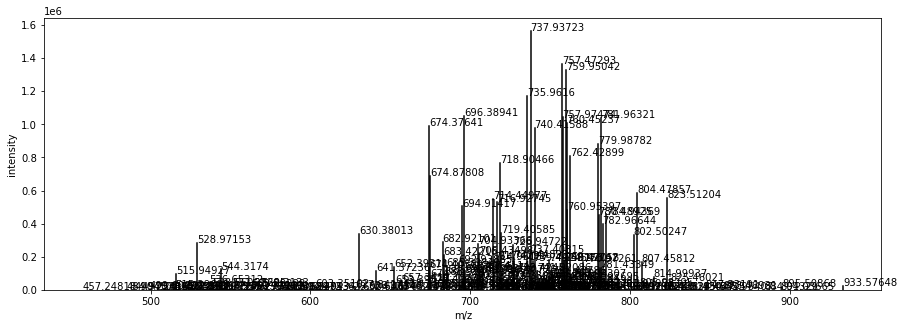

2nd Spectrum RT =  12.4


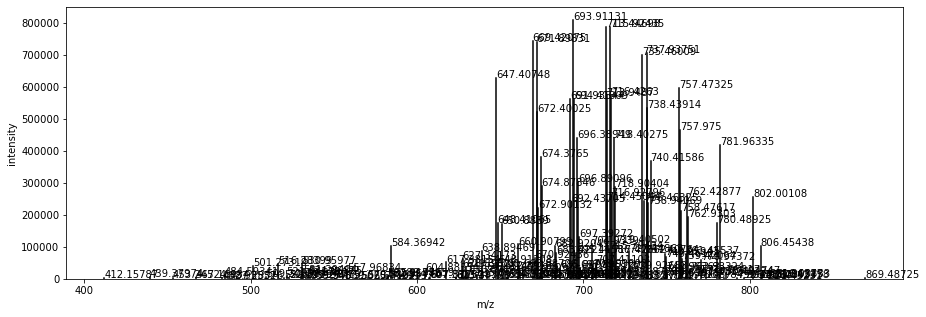

Comparative RT =  12.4


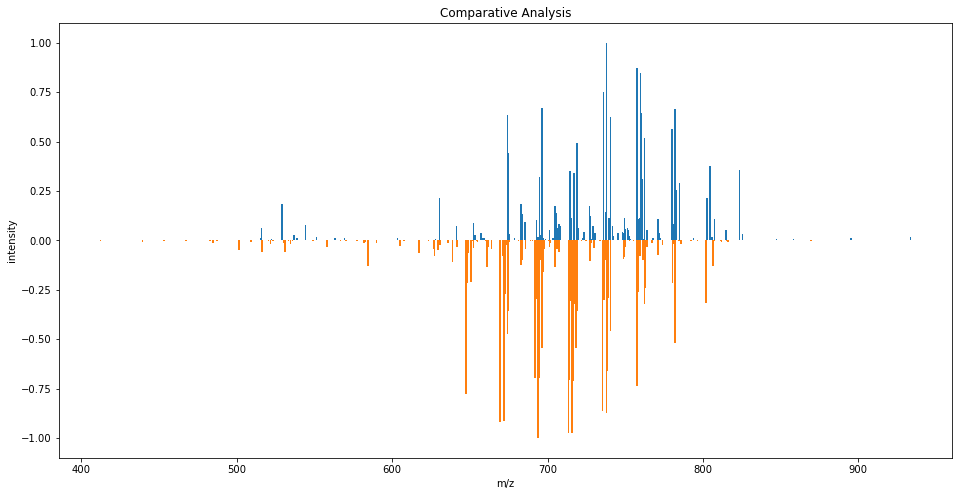

1st Spectrum RT =  12.5


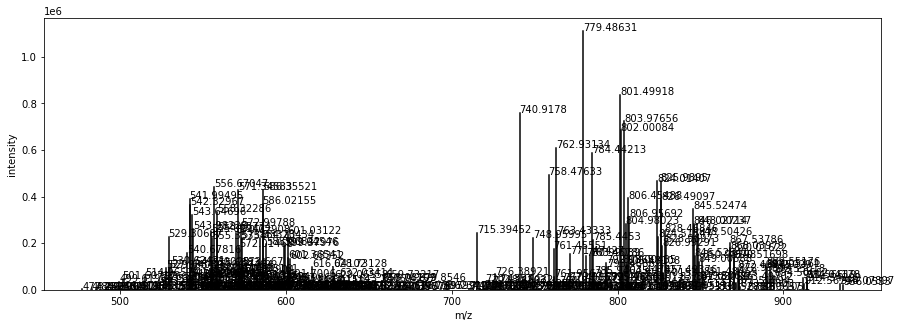

2nd Spectrum RT =  12.5


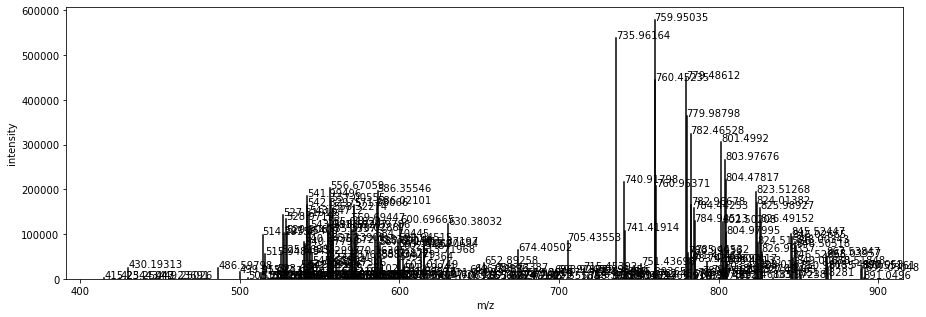

Comparative RT =  12.5


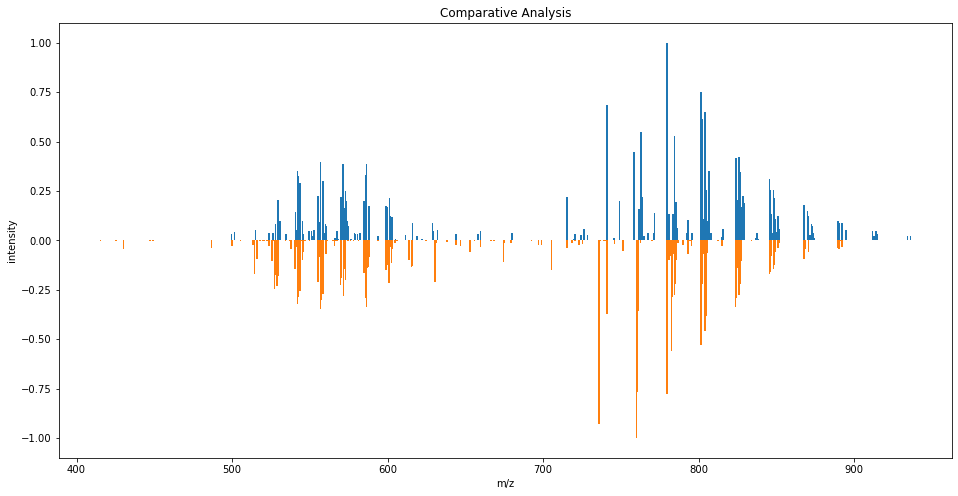

In [106]:
# Generate plots
topVals = RTSort['RT'].sort_values()

for r in topVals:
    dataOldTmp = gabaFile[gabaFile["RT"].round(1)==r]
    dataNewTmp = newFile[newFile["RT"].round(1)==r]

    dataOldTmp = dataOldTmp.reset_index(drop=True)
    dataNewTmp = dataNewTmp.reset_index(drop=True)
    
    spectrumOld.set_peaks([dataOldTmp['m/z'],dataOldTmp['Response']])
    spectrumOld.sortByPosition()

    spectrumNew.set_peaks([dataNewTmp['m/z'],dataNewTmp['Response']])
    spectrumNew.sortByPosition()
    
    print("1st Spectrum RT = ", r)
    plot_spectrum(spectrumOld, 0)
    print("2nd Spectrum RT = ", r)
    plot_spectrum(spectrumNew, 0)
    
    title = 'Comparative Analysis'
    old_mz, old_int = dataOldTmp['m/z'],dataOldTmp['Response']
    new_mz, new_int = dataNewTmp['m/z'],dataNewTmp['Response']

    old_int = [element / max(old_int) for element in old_int]
    new_int = [element / max(new_int) for element in new_int]
    inv_new_int = [-1*element / max(new_int) for element in new_int]
  
    print("Comparative RT = ", r)
    comp_plot(old_mz, old_int, new_mz, inv_new_int, title)
    plt.show()

1st Spectrum RT =  5.9


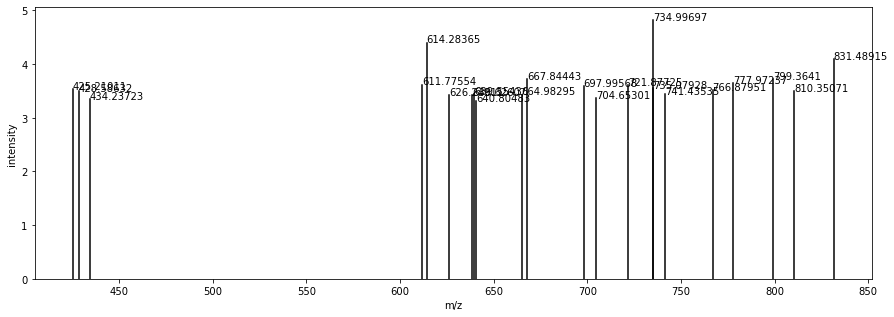

2nd Spectrum RT =  5.9


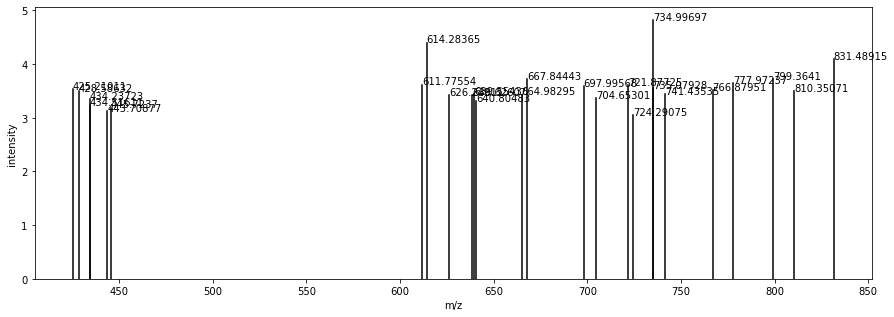

Comparative RT =  5.9


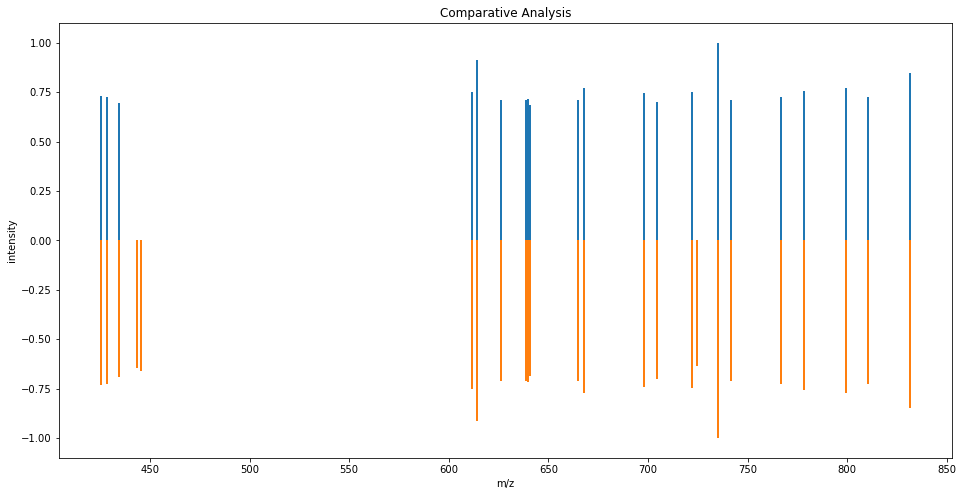

1st Spectrum RT =  8.1


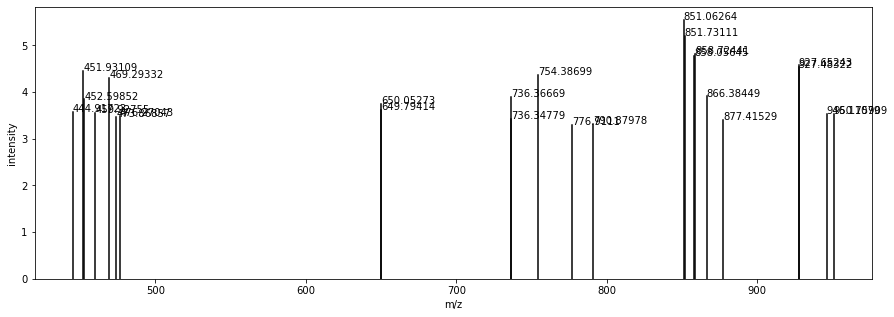

2nd Spectrum RT =  8.1


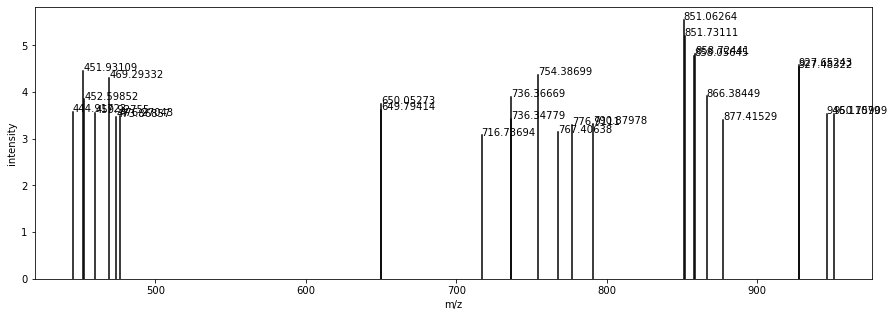

Comparative RT =  8.1


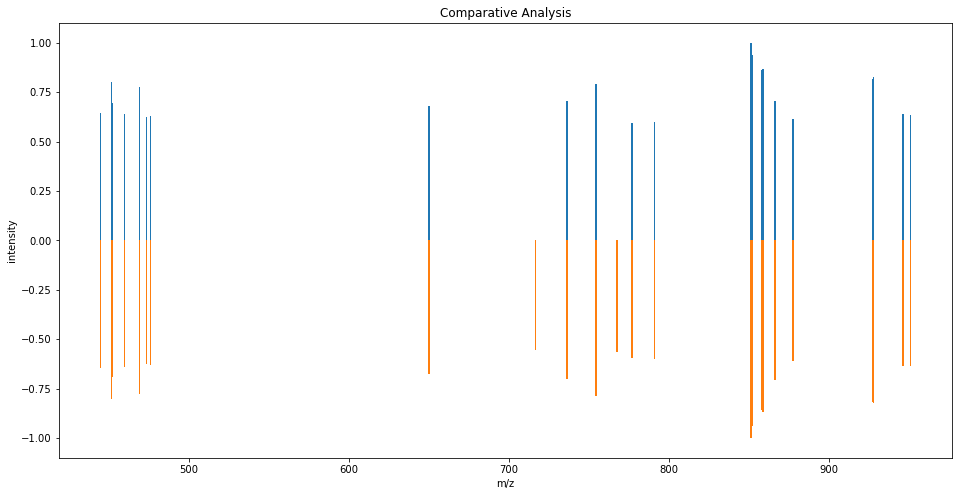

1st Spectrum RT =  8.4


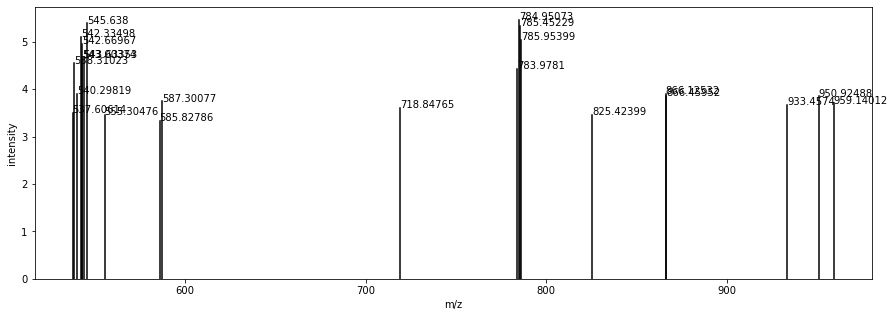

2nd Spectrum RT =  8.4


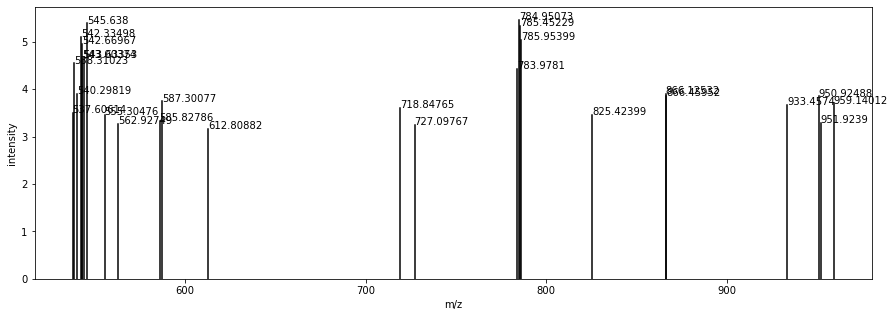

Comparative RT =  8.4


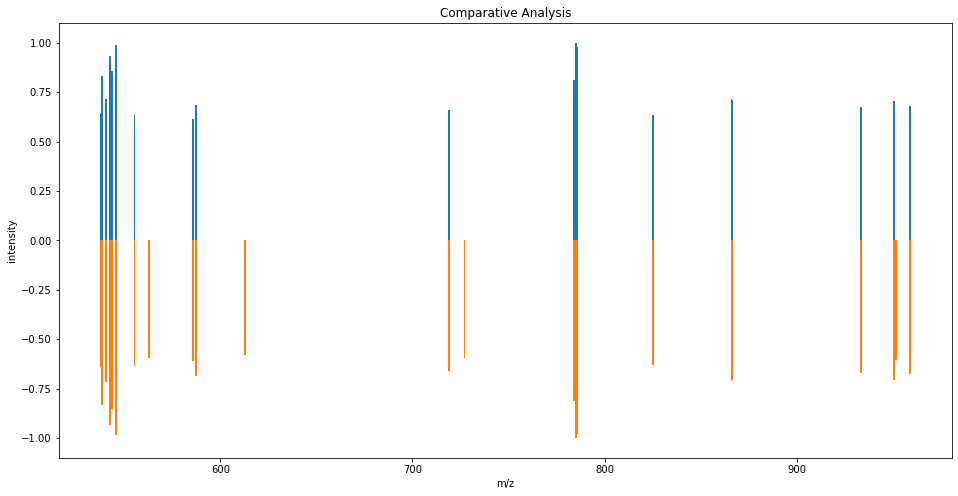

1st Spectrum RT =  12.4


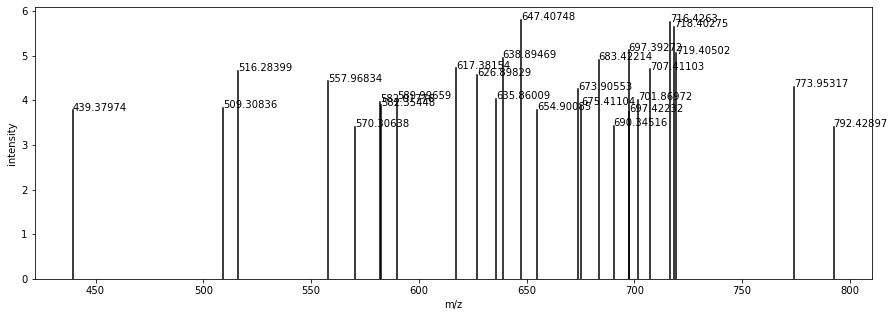

2nd Spectrum RT =  12.4


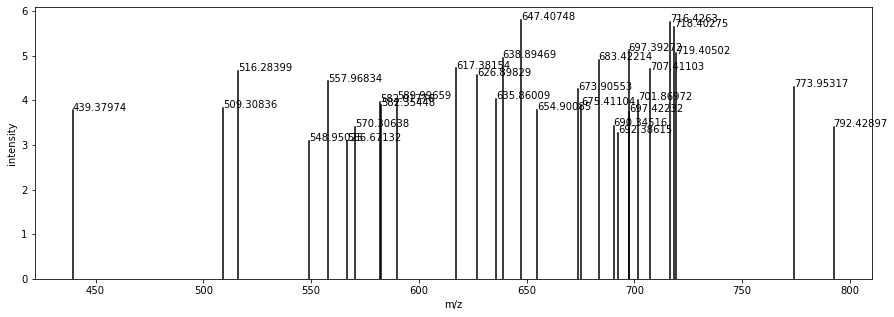

Comparative RT =  12.4


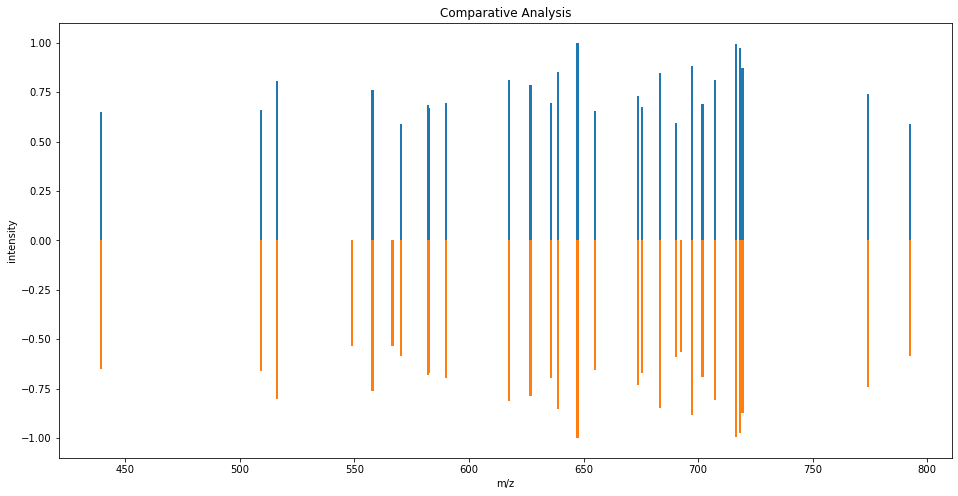

1st Spectrum RT =  12.5


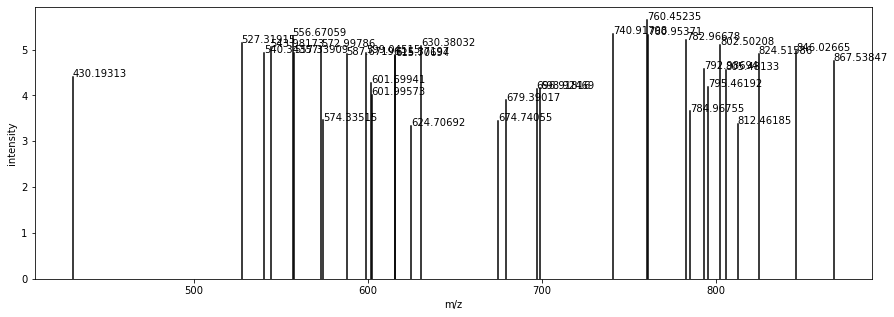

2nd Spectrum RT =  12.5


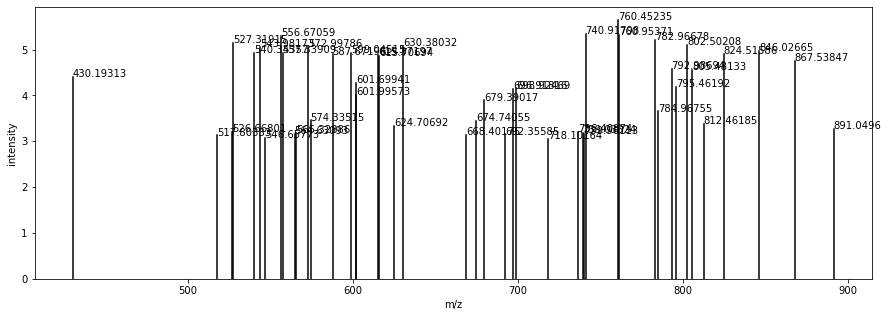

Comparative RT =  12.5


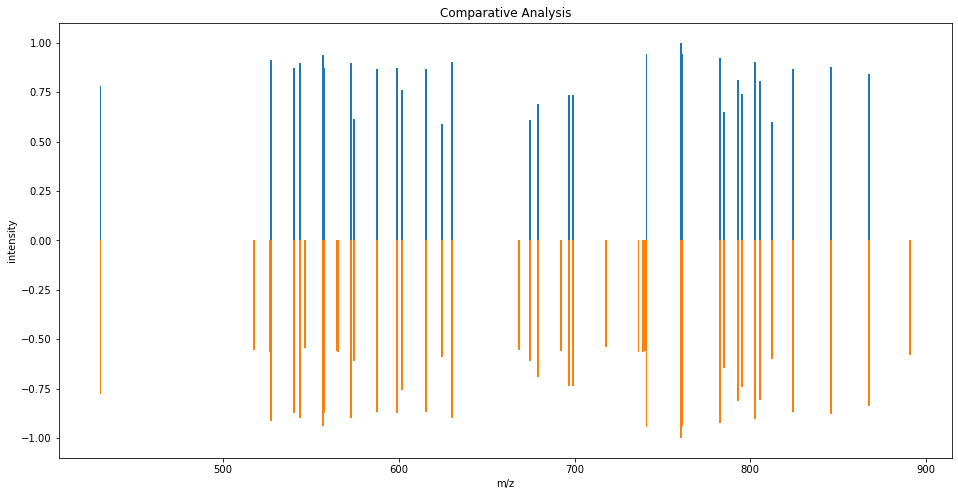

In [107]:
# Generate plots

for r in topVals:
    dataOldTmp = filteredGaba[filteredGaba["RT"].round(1)==r]
    dataNewTmp = filteredNew[filteredNew["RT"].round(1)==r]

    dataOldTmp = dataOldTmp.reset_index(drop=True)
    dataNewTmp = dataNewTmp.reset_index(drop=True)
    
    spectrumOld.set_peaks([dataOldTmp['m/z'],dataOldTmp['Response']])
    spectrumOld.sortByPosition()

    spectrumNew.set_peaks([dataNewTmp['m/z'],dataNewTmp['Response']])
    spectrumNew.sortByPosition()
    
    print("1st Spectrum RT = ", r)
    plot_spectrum(spectrumOld, 0)
    print("2nd Spectrum RT = ", r)
    plot_spectrum(spectrumNew, 0)
    
    title = 'Comparative Analysis'
    old_mz, old_int = dataOldTmp['m/z'],dataOldTmp['Response']
    new_mz, new_int = dataNewTmp['m/z'],dataNewTmp['Response']

    old_int = [element / max(old_int) for element in old_int]
    new_int = [element / max(new_int) for element in new_int]
    inv_new_int = [-1*element / max(new_int) for element in new_int]
  
    print("Comparative RT = ", r)
    comp_plot(old_mz, old_int, new_mz, inv_new_int, title)
    plt.show()